# Clustering Patients by CCSR codes

## MIMIC-IV dataset 
## Hospital

### Imports

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import math
import statistics
from scipy import stats
import scipy.stats
from scipy.stats import norm
import plotly.express as px
import seaborn as sns
from sklearn.cluster import KMeans

### Admissions

In [5]:
# Hospital admissions
adm = pd.read_csv('admissions.csv.gz', compression='gzip')

### Patients

In [6]:
# Read the file
patient = pd.read_csv('patients.csv.gz', compression='gzip')

### ICD codes for Diagnoses

In [7]:
# icd_codes for diagnoses
icd_diag = pd.read_csv('d_icd_diagnoses.csv.gz', compression='gzip')

### Patients Diagnoses ICD

In [8]:
# Patients diagnoses icd
diag_icd = pd.read_csv('diagnoses_icd.csv.gz', compression='gzip')

### Patients Diagnoses CCSR

In [31]:
# Patients diagnoses icd
diag_ccsr = pd.read_csv('diagnoses_ccsr.csv')

In [32]:
diag_ccsr.shape

(2016216, 10)

In [11]:
diag_ccsr.head(3)

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system
1,10110584,24580984,5,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system
2,10229302,26194242,14,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system


In [12]:
# Eliminate CCSR that appear less than 10 times
diag_ccsr=diag_ccsr[diag_ccsr.groupby('ccsr_code').icd_code.transform('count') > 10]
diag_ccsr.shape

(2016105, 10)

In [13]:
# Lets eliminate subjects that only appear once
diag_ccsr=diag_ccsr[diag_ccsr.groupby('subject_id').subject_id.transform('count') >1]
diag_ccsr.shape

(2015090, 10)

### Patients Diagnoses CCSR & Demographics

In [14]:
# Patients diagnoses icd
diag_ccsr_pat = pd.read_csv('diagnoses_ccsr_patients.csv')

In [15]:
diag_ccsr_pat.head()

,subject_id,ccsr_code,gender,anchor_age,anchor_year_group,dod,age_group
0,10000084,"NVS011,SYM016,END010,END010,FAC021,FAC021,SYM0...",M,72,2017 - 2019,1,66-80
1,10000117,"END010,DIG008,EXT003,DIG004,DIG004,MUS013,EXT0...",F,48,2008 - 2010,0,41-65
2,10000980,"FAC021,CIR019,CIR019,SYM013,CIR012,MUS033,DIG0...",F,73,2008 - 2010,1,66-80
3,10001401,"GEN004,GEN004,CIR017,CIR007,FAC021,CIR033,CIR0...",F,89,2014 - 2016,0,81-91
4,10001667,"CIR019,FAC025,CIR008,END007,CIR016,SYM010,FAC0...",F,86,2017 - 2019,1,81-91


In [16]:
diag_ccsr_pat_2= diag_ccsr_pat[["subject_id","gender"]]
diag_ccsr_pat_2.shape

(85596, 2)

In [17]:
diag_ccsr_pat_2.sort_values("subject_id").head()

,subject_id,gender
0,10000084,M
1,10000117,F
2,10000980,F
3,10001401,F
4,10001667,F


## Clustering

In [18]:
# Let's use the other table first
diag_ccsr.head(3)

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system
1,10110584,24580984,5,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system
2,10229302,26194242,14,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system


In [17]:
diag_ccsr.shape

(2015090, 10)

In [18]:
diag_ccsr_=diag_ccsr.drop(columns=['hadm_id', 'seq_num', 'icd_code', 'icd_version','diagnose', 'CCSR Description', 'MEPS collapsed condition category', 'Category Body System'])

In [19]:
diag_ccsr_.sort_values("subject_id")

,subject_id,ccsr_code
0,10000084,NVS011
15071,10000084,SYM016
24971,10000084,END010
24972,10000084,END010
82417,10000084,FAC021
...,...,...
1938824,19999828,MUS022
309115,19999828,MBD005
309114,19999828,MBD005
1328882,19999828,RSP008


In [20]:
diag_ccsr_.value_counts("subject_id")

subject_id
12468016    1452
18902344    1153
10913302    1030
12294892     869
19921471     841
            ... 
12573470       2
14304718       2
17567743       2
12573798       2
19237710       2
Name: count, Length: 85596, dtype: int64

In [ ]:
diag_ccsr_enc = pd.get_dummies(diag_ccsr_, columns=['ccsr_code'], dtype=int)

In [ ]:
diag_ccsr_enc = diag_ccsr_enc.groupby('subject_id').sum().reset_index()

In [23]:
diag_ccsr_enc.head()

,subject_id,ccsr_code_BLD001,ccsr_code_BLD002,ccsr_code_BLD003,ccsr_code_BLD004,ccsr_code_BLD005,ccsr_code_BLD006,ccsr_code_BLD007,ccsr_code_BLD008,ccsr_code_BLD009,...,ccsr_code_SYM007,ccsr_code_SYM008,ccsr_code_SYM010,ccsr_code_SYM011,ccsr_code_SYM012,ccsr_code_SYM013,ccsr_code_SYM014,ccsr_code_SYM015,ccsr_code_SYM016,ccsr_code_SYM017
0,10000084,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,2,0
1,10000117,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,10000980,1,0,2,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
3,10001401,1,0,1,2,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,2
4,10001667,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,1


In [24]:
diag_ccsr_enc.shape

(85596, 464)

#### Save file 'ccsr_diag_dummies.csv'

In [74]:
# Save this file
#diag_ccsr_enc.to_csv('ccsr_diag_dummies.csv', index=False)

In [14]:
diag_ccsr_enc= pd.read_csv('ccsr_diag_dummies.csv')

In [15]:
# scaled data
from sklearn.preprocessing import MinMaxScaler
b=diag_ccsr_enc[["subject_id"]]
a=diag_ccsr_enc.drop(columns=["subject_id"])

sc_diag_ccsr_enc = MinMaxScaler().fit_transform(a.values)
sc_diag_ccsr_enc = pd.DataFrame(sc_diag_ccsr_enc, index=a.index, columns=a.columns)
sc_diag_ccsr_enc.insert(0, 'subject_id', b)

In [16]:
sc_diag_ccsr_enc=pd.DataFrame(sc_diag_ccsr_enc)
sc_diag_ccsr_enc.head()

,subject_id,ccsr_code_BLD001,ccsr_code_BLD002,ccsr_code_BLD003,ccsr_code_BLD004,ccsr_code_BLD005,ccsr_code_BLD006,ccsr_code_BLD007,ccsr_code_BLD008,ccsr_code_BLD009,...,ccsr_code_SYM007,ccsr_code_SYM008,ccsr_code_SYM010,ccsr_code_SYM011,ccsr_code_SYM012,ccsr_code_SYM013,ccsr_code_SYM014,ccsr_code_SYM015,ccsr_code_SYM016,ccsr_code_SYM017
0,10000084,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.043478,0.00,0.000000,0.000000,0.0,0.0625,0.153846,0.000000
1,10000117,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.00,0.055556,0.000000,0.0,0.0000,0.000000,0.000000
2,10000980,0.045455,0.0,0.076923,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.00,0.000000,0.055556,0.0,0.0000,0.000000,0.035714
3,10001401,0.045455,0.0,0.038462,0.2,0.0,0.0,0.035714,0.0,0.0,...,0.0,0.0,0.000000,0.05,0.000000,0.000000,0.0,0.0000,0.000000,0.071429
4,10001667,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.086957,0.00,0.000000,0.000000,0.0,0.0000,0.000000,0.035714


In [17]:
sc_diag_ccsr_enc.shape

(85596, 464)

#### Save file

In [18]:
# Save this file
#sc_diag_ccsr_enc.to_csv('ccsr_diag_dummies_scaled.csv', index=False)

In [8]:
# Scaled
subject_id_sc=sc_diag_ccsr_enc[["subject_id"]]
sc_diag_ccsr_enc_=sc_diag_ccsr_enc.drop(columns=['subject_id'])

#### K means

In [9]:
from sklearn.cluster import KMeans

# Function to optimize kmeans number of clusters based on inertia
def optimize_k_means(data, max_k):
  means = []
  inertias = []
  silhouette_avg = []

  for k in range(1,max_k):
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(data)

    means.append(k)
    inertias.append(kmeans.inertia_)
    cluster_labels = kmeans.labels_

  # Elbow plot
  fig = plt.subplots(figsize=(8,4))
  plt.plot(means, inertias, 'o-')
  plt.xlabel('Number of Clusters')
  plt.ylabel('Inertia')
  plt.grid(True)
  plt.show()

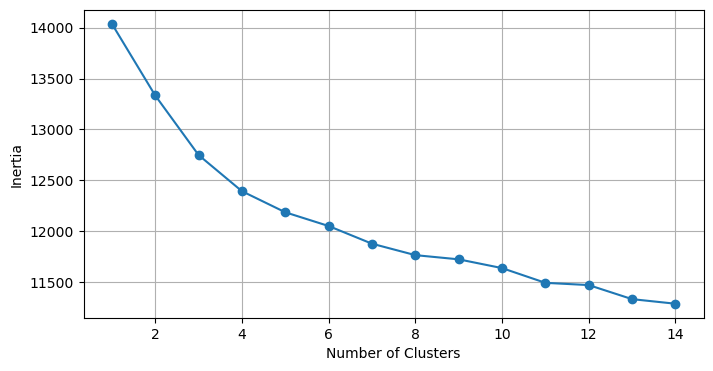

In [10]:
# Scaled
optimize_k_means(sc_diag_ccsr_enc_, 15)

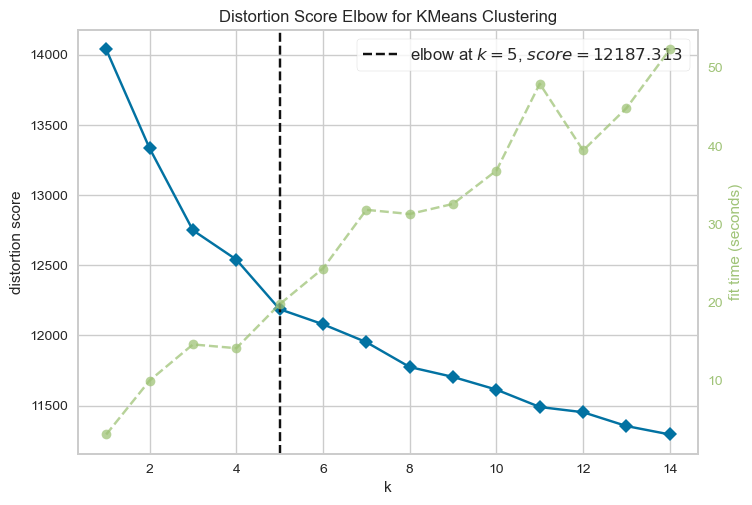

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [209]:
# scaled
from yellowbrick.cluster import KElbowVisualizer
km = KMeans(random_state=42, n_init=10) 
visualizer = KElbowVisualizer(km, k=(1,15))
visualizer.fit(sc_diag_ccsr_enc_)        # Fit the data to the visualizer
visualizer.show()                # Finalize and render the figure

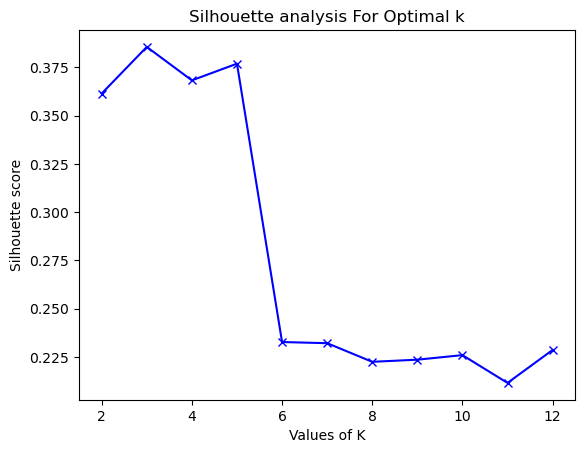

In [11]:
from sklearn.metrics import silhouette_score
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
silhouette_avg = []
for num_clusters in range_n_clusters:
 # initialise kmeans
 kmeans = KMeans(n_clusters=num_clusters, n_init=10)
 kmeans.fit(sc_diag_ccsr_enc_)
 cluster_labels = kmeans.labels_
 # silhouette score
 silhouette_avg.append(silhouette_score(sc_diag_ccsr_enc_, cluster_labels))

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')
plt.show()

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(4 , 2, figsize=(15,8))   # 8 subplots 
for i in [2, 3, 4, 5, 6, 7, 8, 9]:   # number of clusters
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    q, mod = divmod(i, 2)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(sc_diag_ccsr_enc_) 

#### Apply PCA for better visuallization

In [20]:
# Apply PCA to the data
from sklearn.decomposition import PCA
pca = PCA(2)
df = pca.fit_transform(sc_diag_ccsr_enc_)
df.shape

(85596, 2)

##### 3 clusters

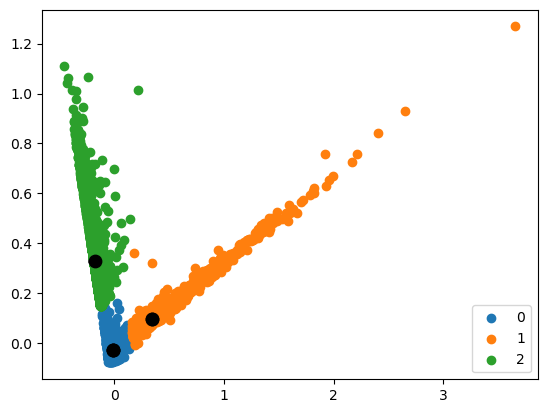

In [121]:
# Apply kmeans to the dimensionaly reduced data
kmeans = KMeans(n_clusters= 3, n_init=10)
label = kmeans.fit_predict(df)
u_labels = np.unique(label)
centroids = kmeans.cluster_centers_

#plotting the results with the 2 first PC:
for i in u_labels:
    plt.scatter(df[label == i , 0] , df[label == i , 1] , label = i)
    plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

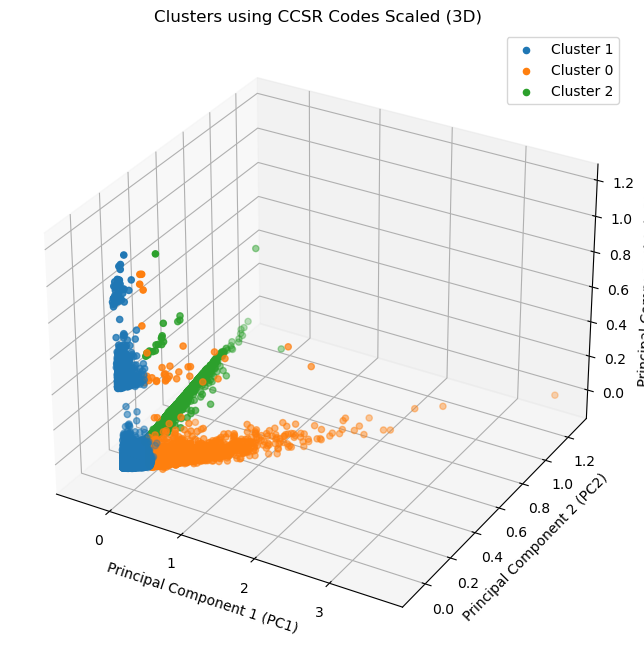

In [26]:
# Scaled data
kmeans = KMeans(n_clusters =3, random_state=123,n_init=10)
model=kmeans.fit(sc_diag_ccsr_enc_)
sc_diag_ccsr_enc['k_means_3'] = kmeans.labels_

# Perform PCA with 3 components
pca = PCA(n_components=3)
X_pca_3d = pca.fit_transform(sc_diag_ccsr_enc_)

cluster_labels = sc_diag_ccsr_enc['k_means_3']

# Create a 3D scatter plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot each cluster with a different color
for cluster in cluster_labels.unique():
    ax.scatter(X_pca_3d[cluster_labels == cluster, 0],
               X_pca_3d[cluster_labels == cluster, 1],
               X_pca_3d[cluster_labels == cluster, 2],
               label=f'Cluster {cluster}')

ax.set_title('Clusters using CCSR Codes Scaled (3D)')
ax.set_xlabel('Principal Component 1 (PC1)')
ax.set_ylabel('Principal Component 2 (PC2)')
ax.set_zlabel('Principal Component 3 (PC3)')
ax.legend()
plt.show()

##### 5 clusters

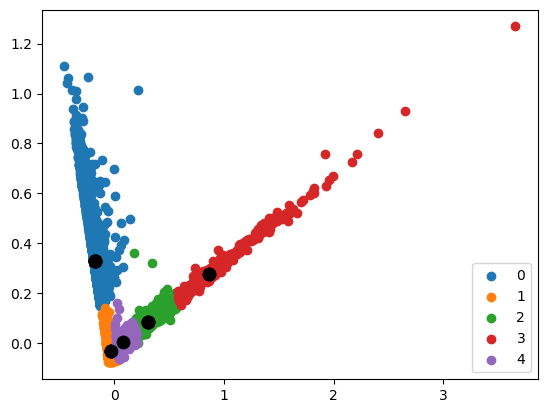

In [21]:
# Apply kmeans to the dimensionaly reduced data
kmeans = KMeans(n_clusters= 5, n_init=10)
label = kmeans.fit_predict(df)
u_labels = np.unique(label)
centroids = kmeans.cluster_centers_

#plotting the results with the 2 first PC:
for i in u_labels:
    plt.scatter(df[label == i , 0] , df[label == i , 1] , label = i)
    plt.scatter(centroids[:,0] , centroids[:,1] , s = 80, color = 'k')
plt.legend()
plt.show()

In [22]:
# Scaled data
kmeans = KMeans(n_clusters =5, random_state=123,n_init=10)
model=kmeans.fit(sc_diag_ccsr_enc_)
sc_diag_ccsr_enc['k_means_5'] = kmeans.labels_

In [23]:
cluster_0 = sc_diag_ccsr_enc[sc_diag_ccsr_enc['k_means_5'] == 0]
cluster_1 = sc_diag_ccsr_enc[sc_diag_ccsr_enc['k_means_5'] == 1]
cluster_2 = sc_diag_ccsr_enc[sc_diag_ccsr_enc['k_means_5'] == 2]
cluster_3 = sc_diag_ccsr_enc[sc_diag_ccsr_enc['k_means_5'] == 3]
cluster_4 = sc_diag_ccsr_enc[sc_diag_ccsr_enc['k_means_5'] == 4]

cluster_0.shape, cluster_1.shape, cluster_2.shape, cluster_3.shape, cluster_4.shape

((1113, 465), (68152, 465), (1262, 465), (4767, 465), (10302, 465))

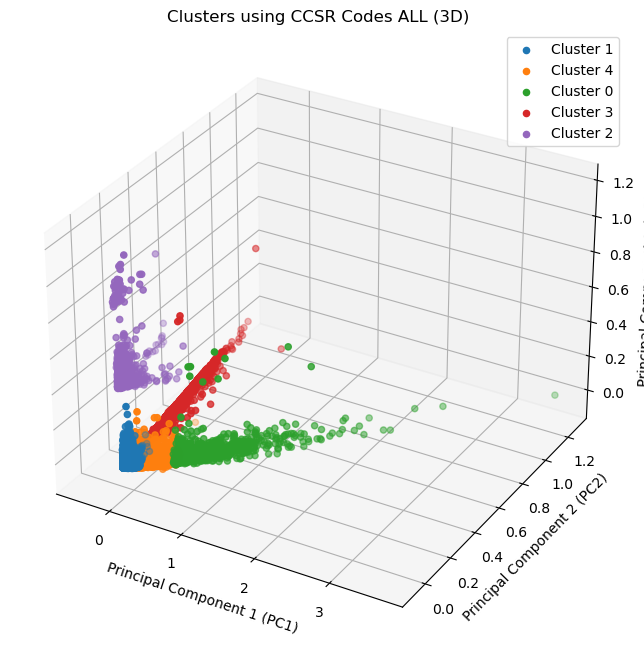

In [133]:
# Perform PCA with 5 components
pca = PCA(n_components=3)
X_pca_3d = pca.fit_transform(sc_diag_ccsr_enc_)

cluster_labels = sc_diag_ccsr_enc['k_means_5']

# Create a 3D scatter plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot each cluster with a different color
for cluster in cluster_labels.unique():
    ax.scatter(X_pca_3d[cluster_labels == cluster, 0],
               X_pca_3d[cluster_labels == cluster, 1],
               X_pca_3d[cluster_labels == cluster, 2],
               label=f'Cluster {cluster}')

ax.set_title('Clusters using CCSR Codes ALL (3D)')
ax.set_xlabel('Principal Component 1 (PC1)')
ax.set_ylabel('Principal Component 2 (PC2)')
ax.set_zlabel('Principal Component 3 (PC3)')
ax.legend()
plt.show()

#### Merged results for EDA

In [28]:
# Clusters data
sc_ccsr_clus=sc_diag_ccsr_enc[["subject_id","k_means_3","k_means_5","k_means_10"]]

In [29]:
# Patients diagnoses ccsr
diag_ccsr_pat = pd.read_csv('diagnoses_ccsr_patients.csv')

In [30]:
# Merged data
pat_diag_clus_sc = pd.merge(diag_ccsr_pat,sc_ccsr_clus,  on='subject_id', how='inner')

In [31]:
pat_diag_clus_sc.head(10)

,subject_id,ccsr_code,gender,anchor_age,anchor_year_group,dod,age_group,k_means_3,k_means_5,k_means_10
0,10000084,"NVS011,SYM016,END010,END010,FAC021,FAC021,SYM0...",M,72,2017 - 2019,1,66-80,1,1,6
1,10000117,"END010,DIG008,EXT003,DIG004,DIG004,MUS013,EXT0...",F,48,2008 - 2010,0,41-65,1,1,7
2,10000980,"FAC021,CIR019,CIR019,SYM013,CIR012,MUS033,DIG0...",F,73,2008 - 2010,1,66-80,1,4,4
3,10001401,"GEN004,GEN004,CIR017,CIR007,FAC021,CIR033,CIR0...",F,89,2014 - 2016,0,81-91,0,4,9
4,10001667,"CIR019,FAC025,CIR008,END007,CIR016,SYM010,FAC0...",F,86,2017 - 2019,1,81-91,1,1,6
5,10001843,"FAC025,CIR017,CIR011,CIR008,EXT027,FAC025,EXT0...",M,73,2017 - 2019,0,66-80,1,1,6
6,10001884,"RSP008,FAC021,RSP012,RSP008,FAC021,FAC021,RSP0...",F,68,2008 - 2010,1,66-80,0,0,9
7,10001919,"NEO070,CIR033,EXT027,FAC021,FAC025,GEN007,EXT0...",M,59,2017 - 2019,1,41-65,1,1,6
8,10002013,"INF003,END003,FAC021,NVS016,CIR011,EXT025,END0...",F,53,2008 - 2010,0,41-65,1,4,3
9,10002131,"MUS010,END008,CIR019,END011,DIG025,FAC010,CIR0...",F,87,2011 - 2013,1,81-91,1,1,6


##### Clusters Age Distribution

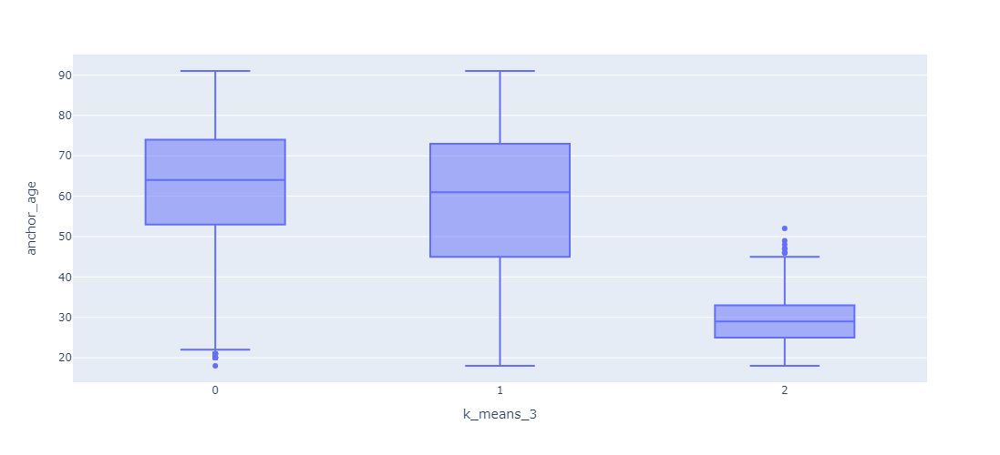

In [149]:
px.box(pat_diag_clus_sc, x="k_means_3", y="anchor_age",width=700, height=500)

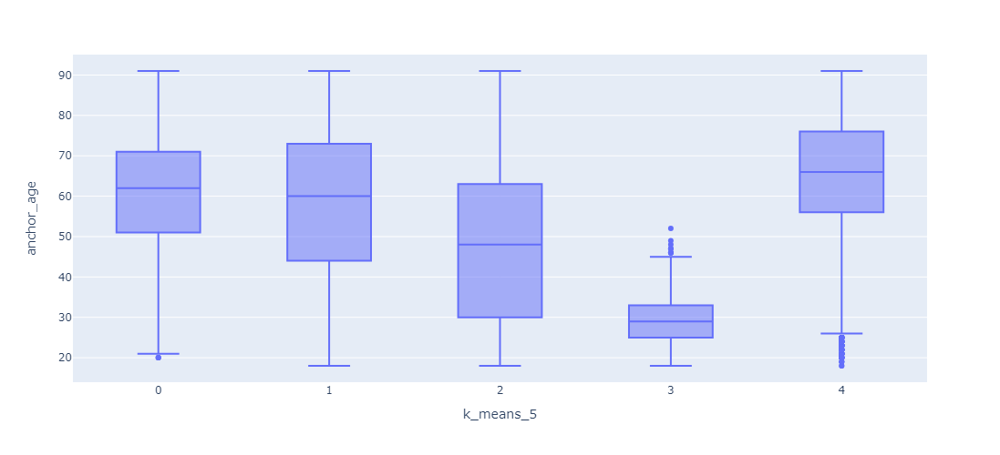

In [150]:
px.box(pat_diag_clus_sc, x="k_means_5", y="anchor_age",width=700, height=500)

##### Clusters' Age per Gender Distribution

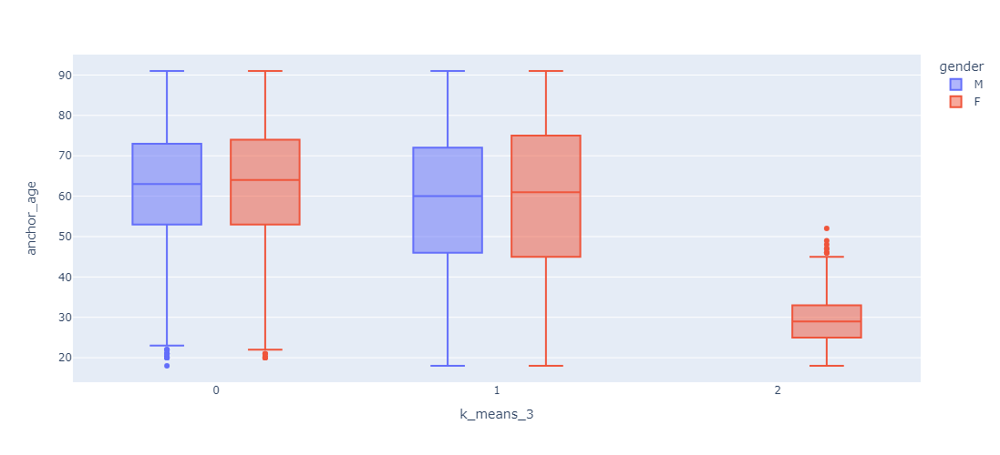

In [152]:
fig = px.box(pat_diag_clus_sc, x="k_means_3", y="anchor_age", color="gender", width=800, height=500)
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

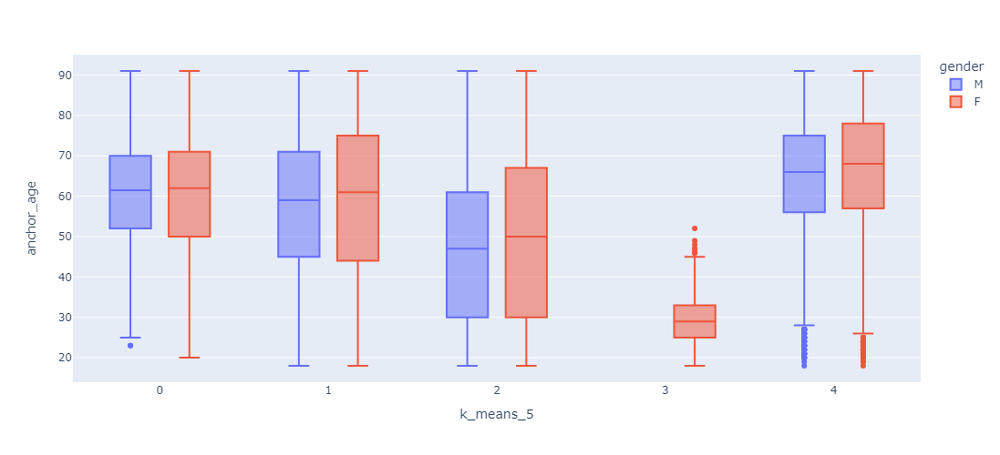

In [153]:
fig = px.box(pat_diag_clus_sc, x="k_means_5", y="anchor_age", color="gender", width=800, height=500)
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

##### Clusters' Age Mortality Distribution

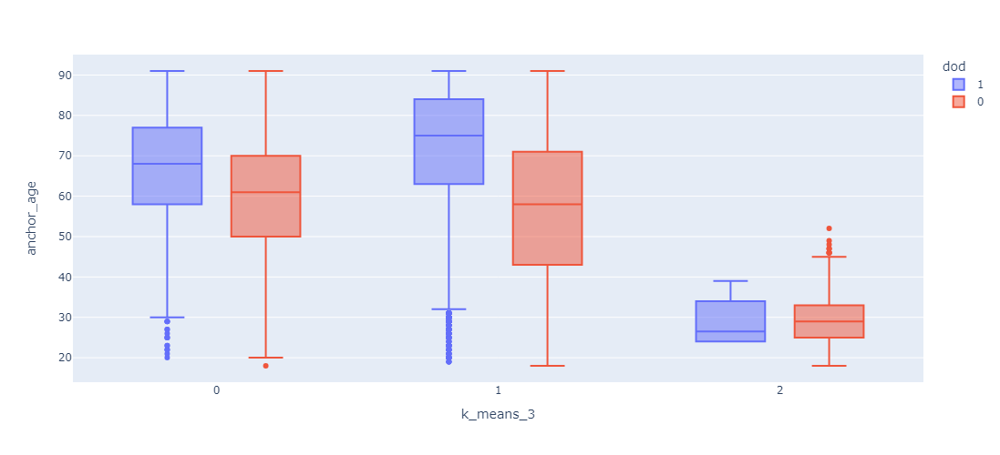

In [199]:
fig = px.box(pat_diag_clus_sc, x="k_means_3", y="anchor_age", color="dod", width=800, height=500)
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

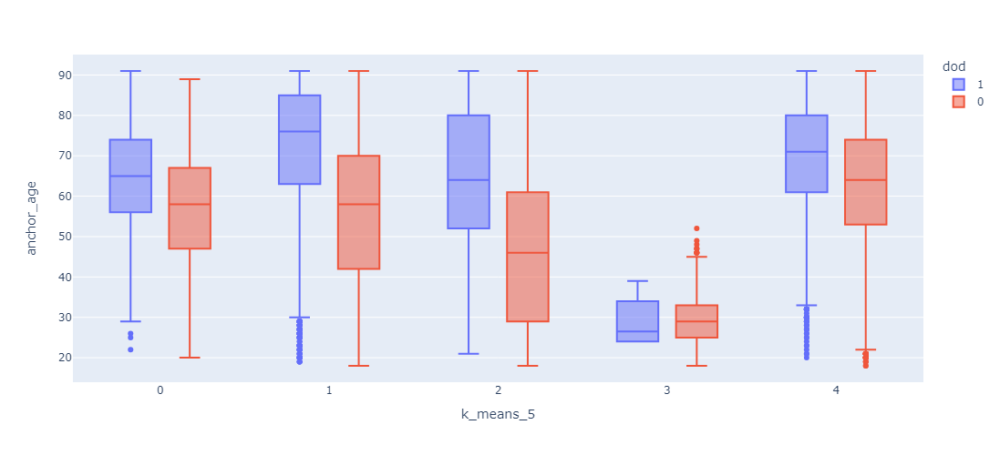

In [200]:
fig = px.box(pat_diag_clus_sc, x="k_means_5", y="anchor_age", color="dod", width=800, height=500)
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

#### Analysis for 5 clusters

In [ ]:
#pat_diag_clus_sc.mean()

In [32]:
pat_diag_clus_sc.k_means_5.value_counts()

k_means_5
1    68152
4    10302
3     4767
2     1262
0     1113
Name: count, dtype: int64

In [155]:
print("The average patients' age for each cluster is:")

pd.DataFrame(pat_diag_clus_sc.groupby("k_means_5")["anchor_age"].mean())

The average patients' age for each cluster is:


,anchor_age
k_means_5,
0,60.279425
1,57.966208
2,48.087163
3,29.374449
4,65.311784


In [35]:
pd.DataFrame(pat_diag_clus_sc.groupby("k_means_5")["gender"].value_counts(normalize=True))

proportion
k_means_5 gender            
0         M         0.517520
          F         0.482480
1         F         0.508217
          M         0.491783
2         M         0.612520
          F         0.387480
3         F         1.000000
4         M         0.531741
          F         0.468259

In [36]:
pd.DataFrame(pat_diag_clus_sc.groupby("k_means_5")["dod"].value_counts(normalize=True))

proportion
k_means_5 dod            
0         0      0.504942
          1      0.495058
1         0      0.873944
          1      0.126056
2         0      0.928685
          1      0.071315
3         0      0.999161
          1      0.000839
4         0      0.628616
          1      0.371384

Text(0.5, 0, 'Gender')

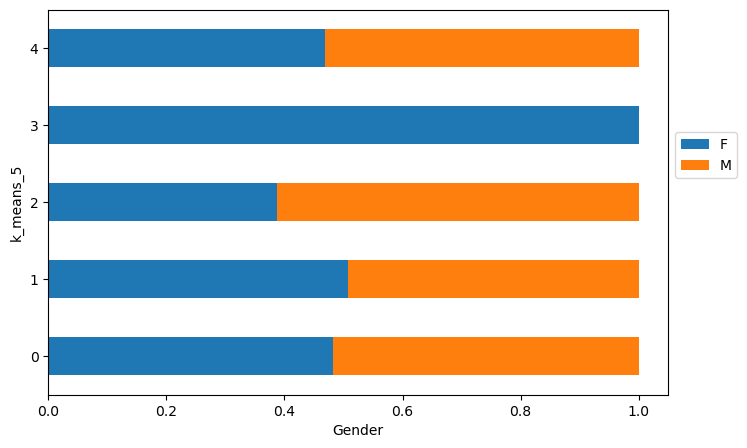

In [156]:
gd = pat_diag_clus_sc.groupby(['k_means_5', 'gender']).size().unstack()
gd.apply(lambda x:x/x.sum(), axis=1).plot(kind='barh', stacked=True, legend=False, figsize=(8,5))
plt.legend(['F', 'M'], bbox_to_anchor=(1.0, 0.7))
plt.xlabel('Gender')

Text(0.5, 0, 'Mortality')

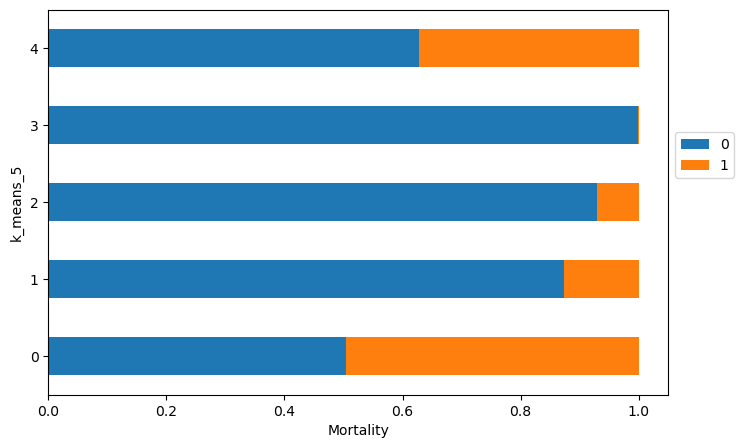

In [157]:
gd = pat_diag_clus_sc.groupby(['k_means_5', 'dod']).size().unstack()
gd.apply(lambda x:x/x.sum(), axis=1).plot(kind='barh', stacked=True, legend=False, figsize=(8,5))
plt.legend(['0', '1'], bbox_to_anchor=(1.0, 0.7))
plt.xlabel('Mortality')

Text(0.5, 0, 'Age Group')

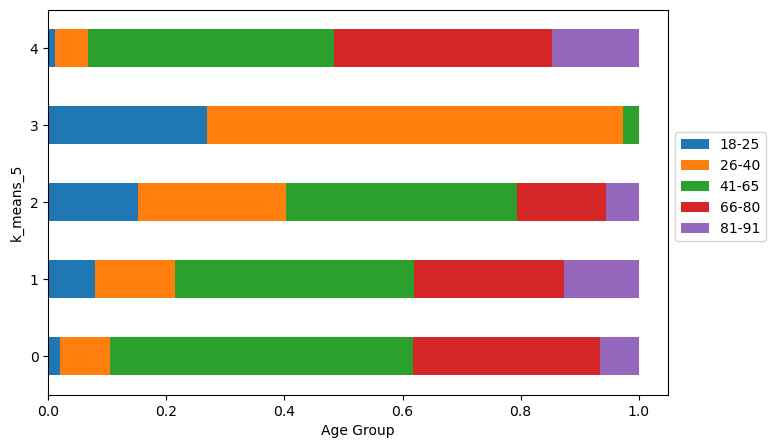

In [158]:
gd = pat_diag_clus_sc.groupby(['k_means_5', 'age_group']).size().unstack()
gd.apply(lambda x:x/x.sum(), axis=1).plot(kind='barh', stacked=True, legend=False, figsize=(8,5))
plt.legend(["18-25", "26-40", "41-65", "66-80", "81-91"], bbox_to_anchor=(1.0, 0.7))
plt.xlabel('Age Group')

In [159]:
pat_diag_ccsr_clus_sc = pd.merge(diag_ccsr, pat_diag_clus_sc[["subject_id", "k_means_5"]],  on='subject_id', how='inner')
pat_diag_ccsr_clus_sc.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
1,10000084,23052089,2,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
2,10000084,29888819,3,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
3,10000084,23052089,3,R441,10,SYM015,Visual hallucinations,General sensation/perception signs and symptoms,General sensation/perception signs and symptom...,"SYM: Symptoms, signs and abnormal clinical and...",1
4,10000084,23052089,4,R296,10,SYM016,Repeated falls,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",1


Text(0.5, 0, 'Diagnoses')

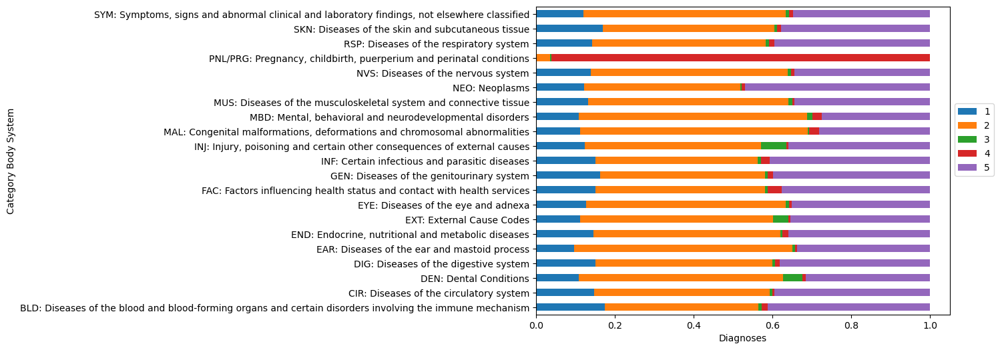

In [160]:
gd = pat_diag_ccsr_clus_sc.groupby(['Category Body System', 'k_means_5']).size().unstack()
gd.apply(lambda x:x/x.sum(), axis=1).plot(kind='barh', stacked=True, legend=False, figsize=(8,6))
plt.legend(['1', '2', '3','4','5','6','7','8','9','10'], bbox_to_anchor=(1.0, 0.7))
plt.xlabel('Diagnoses')

Text(0.5, 0, 'Diagnoses')

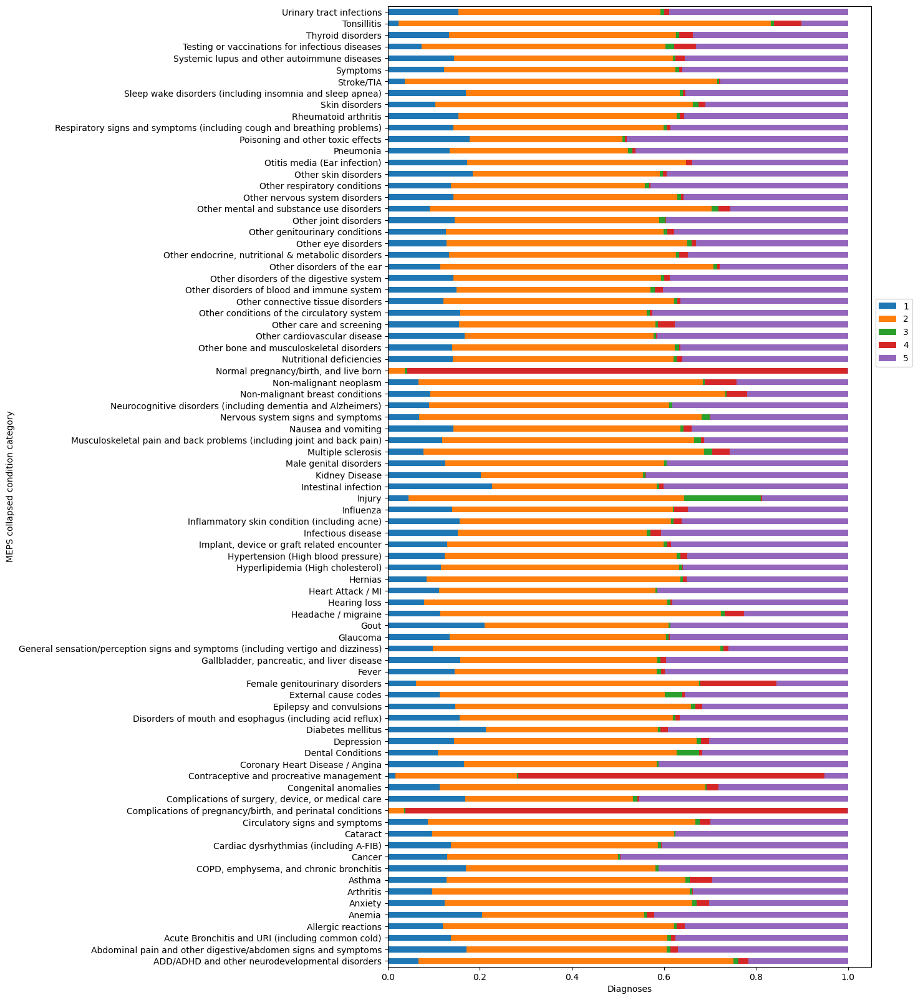

In [162]:
gd = pat_diag_ccsr_clus_sc.groupby(['MEPS collapsed condition category', 'k_means_5']).size().unstack()
gd.apply(lambda x:x/x.sum(), axis=1).plot(kind='barh', stacked=True, legend=False, figsize=(10,20))
plt.legend(['1', '2', '3','4','5','6','7','8','9','10'], bbox_to_anchor=(1.0, 0.7))
plt.xlabel('Diagnoses')

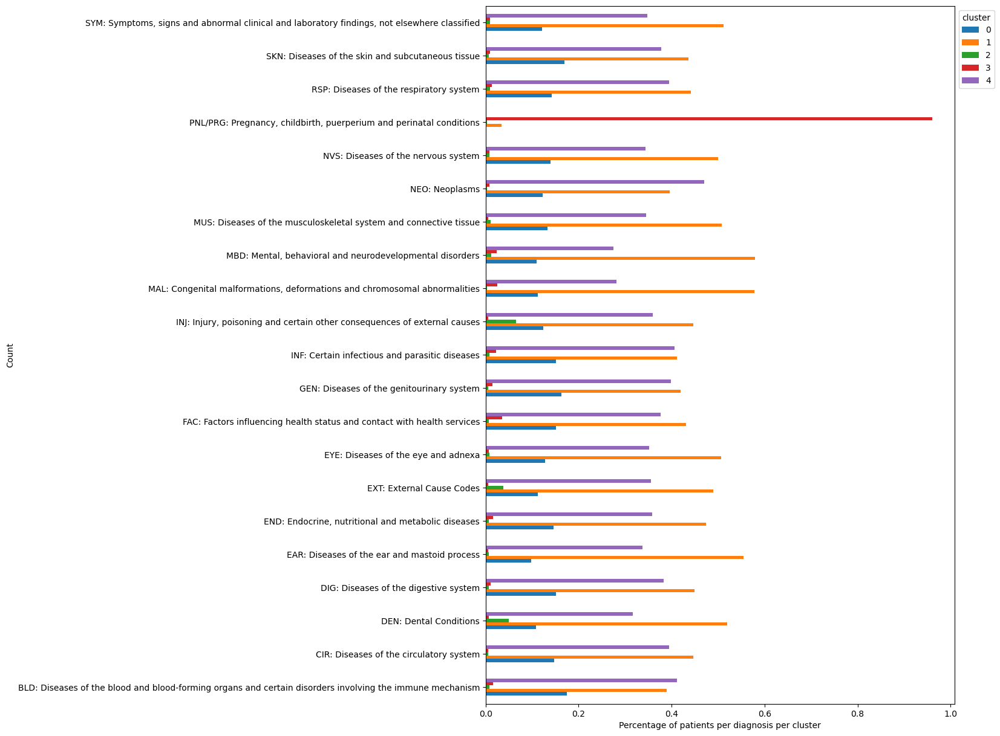

In [163]:
ab=pat_diag_ccsr_clus_sc.groupby(["Category Body System"])['k_means_5'].value_counts(normalize=True).unstack()   #plot(kind='barh', title="% Patients", figsize=(6,3)) 

ax = ab.plot(kind='barh', figsize=(10, 15), xlabel='Percentage of patients per diagnosis per cluster', ylabel='Count', rot=0)
ax.legend(title='cluster', bbox_to_anchor=(1, 1), loc='upper left')

#### Save pat_diag_ccsr_clus' file with clusters

In [198]:
# Save this file
#pat_diag_ccsr_clus_sc.to_csv('pat_diag_ccsr_clus_scaled.csv', index=False)

#### Cluster 1

In [164]:
cluster1 = pat_diag_ccsr_clus_sc[pat_diag_ccsr_clus_sc['k_means_5'] == 0]
cluster1.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
1049,11443963,20635866,4,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
1050,11443963,21850080,14,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
1051,11443963,23920288,4,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
1052,11443963,25158456,14,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0
1053,11443963,25247780,9,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,0


<Axes: title={'center': 'Cluster 1\n Top 10 Diagnoses'}, ylabel='diagnose'>

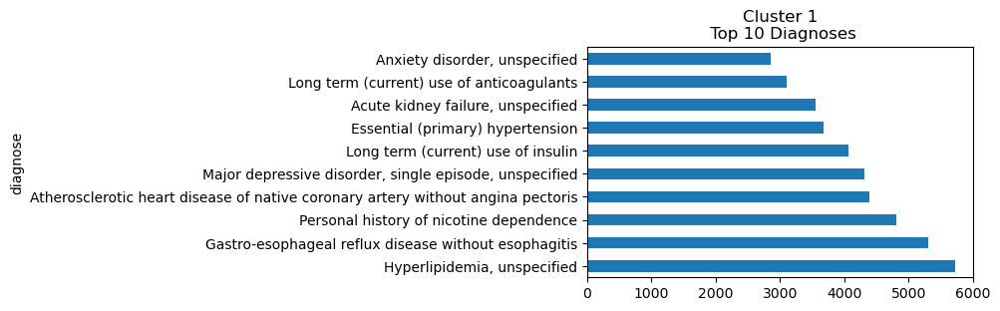

In [165]:
cluster1.diagnose.value_counts().head(10).plot.barh(title="Cluster 1\n Top 10 Diagnoses",figsize=(5,3))

<Axes: title={'center': 'Cluster 1\n Top 10 CCSR Codes'}, ylabel='ccsr_code'>

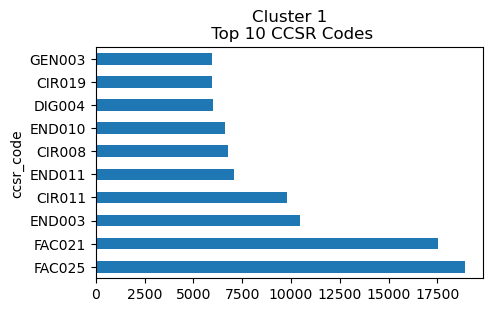

In [166]:
cluster1.ccsr_code.value_counts().head(10).plot.barh(title="Cluster 1\n Top 10 CCSR Codes",figsize=(5,3))

<Axes: title={'center': 'Cluster 1\n Top 10 Category Body System'}, ylabel='Category Body System'>

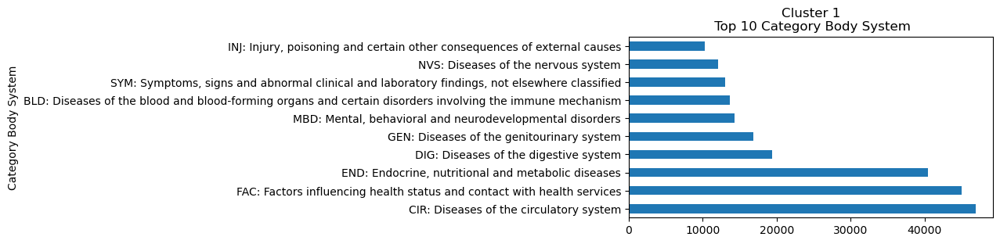

In [167]:
cluster1["Category Body System"].value_counts().head(10).plot.barh(title="Cluster 1\n Top 10 Category Body System", figsize=(6,3))

<Axes: title={'center': 'Cluster 1\n Top 10 MEPS category'}, ylabel='MEPS collapsed condition category'>

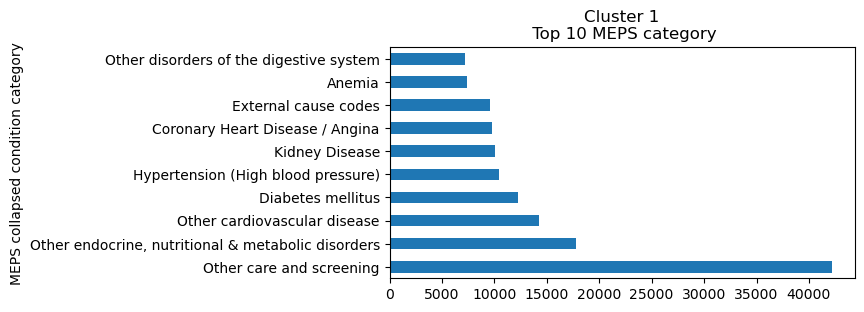

In [168]:
cluster1["MEPS collapsed condition category"].value_counts().head(10).plot.barh(title="Cluster 1\n Top 10 MEPS category", figsize=(6,3))

#### Cluster 2

In [169]:
cluster2 = pat_diag_ccsr_clus_sc[pat_diag_ccsr_clus_sc['k_means_5'] == 1]
cluster2.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
0,10000084,23052089,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
1,10000084,23052089,2,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
2,10000084,29888819,3,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,1
3,10000084,23052089,3,R441,10,SYM015,Visual hallucinations,General sensation/perception signs and symptoms,General sensation/perception signs and symptom...,"SYM: Symptoms, signs and abnormal clinical and...",1
4,10000084,23052089,4,R296,10,SYM016,Repeated falls,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",1


<Axes: title={'center': 'Cluster 2\n Top 10 Diagnoses'}, ylabel='diagnose'>

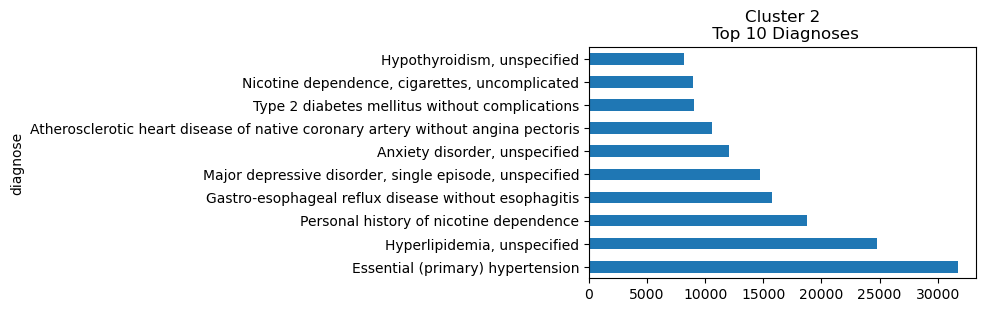

In [170]:
cluster2.diagnose.value_counts().head(10).plot.barh(title="Cluster 2\n Top 10 Diagnoses",figsize=(5,3))

<Axes: title={'center': 'Cluster 2\n Top 10 CCSR cCodes'}, ylabel='ccsr_code'>

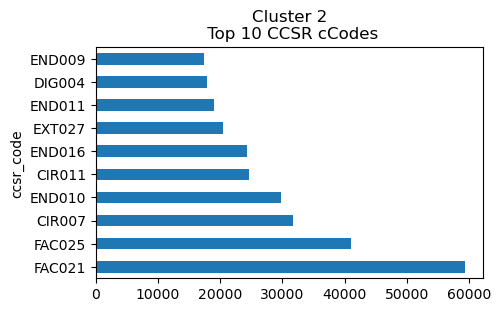

In [171]:
cluster2.ccsr_code.value_counts().head(10).plot.barh(title="Cluster 2\n Top 10 CCSR cCodes",figsize=(5,3))

<Axes: title={'center': 'Cluster 2\n Top 10 Category Body System'}, ylabel='Category Body System'>

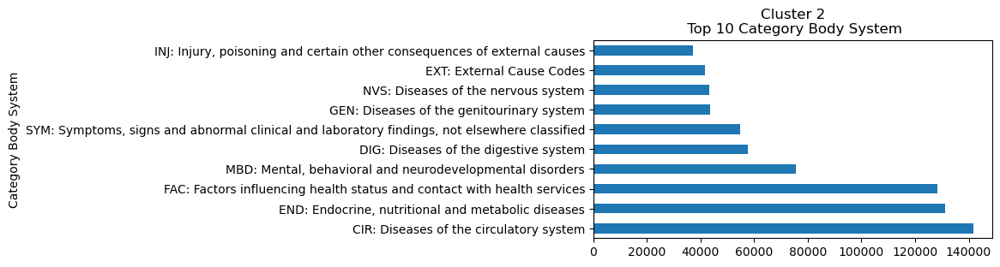

In [172]:
cluster2["Category Body System"].value_counts().head(10).plot.barh(title="Cluster 2\n Top 10 Category Body System", figsize=(6,3))

<Axes: title={'center': 'Cluster 2\n Top 10 MEPS Category'}, ylabel='MEPS collapsed condition category'>

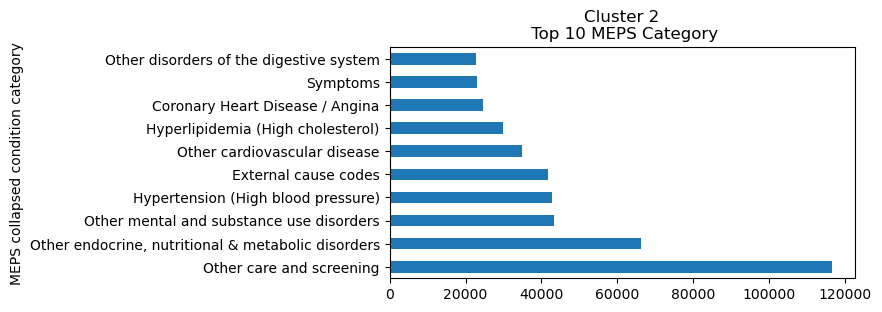

In [173]:
cluster2["MEPS collapsed condition category"].value_counts().head(10).plot.barh(title="Cluster 2\n Top 10 MEPS Category",figsize=(6,3))

#### Cluster 3

In [174]:
cluster3 = pat_diag_ccsr_clus_sc[pat_diag_ccsr_clus_sc['k_means_5'] == 2]
cluster3.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
2758,13150152,28707914,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
2759,13150152,28889072,1,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
2760,13150152,28707914,3,F0281,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
2761,13150152,28889072,2,F0281,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,2
2762,13150152,28707914,2,R64,10,SYM016,Cachexia,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",2


<Axes: title={'center': 'Cluster 3\n Top 10 Diagnoses'}, ylabel='diagnose'>

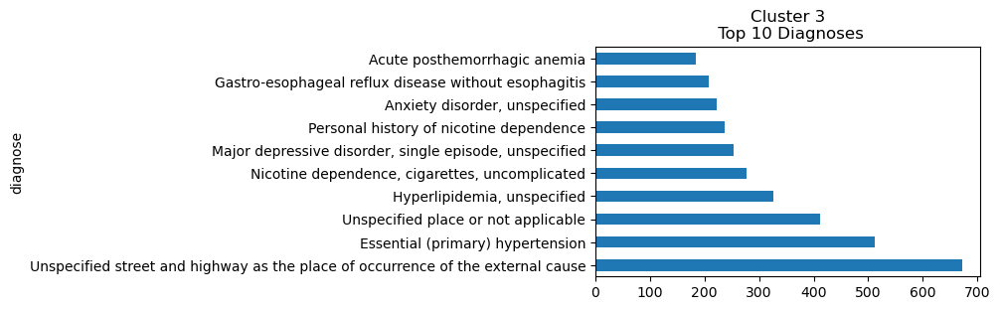

In [175]:
cluster3.diagnose.value_counts().head(10).plot.barh(title="Cluster 3\n Top 10 Diagnoses",figsize=(5,3))

<Axes: title={'center': 'Cluster 3\n Top 10 CCSR Codes'}, ylabel='ccsr_code'>

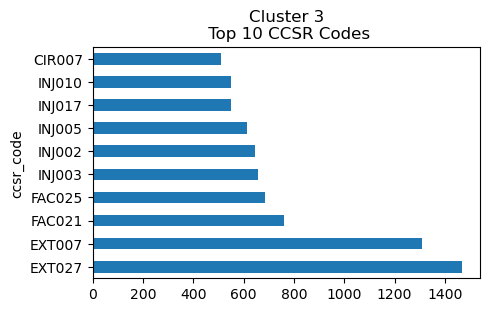

In [176]:
cluster3.ccsr_code.value_counts().head(10).plot.barh(title="Cluster 3\n Top 10 CCSR Codes",figsize=(5,3))

<Axes: title={'center': 'Cluster 3\n Top 10 Category Body System'}, ylabel='Category Body System'>

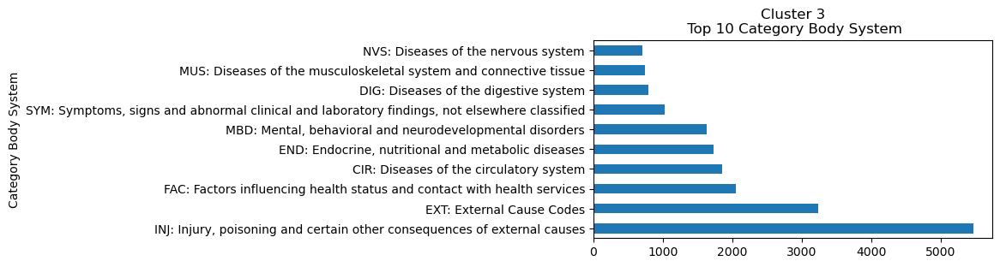

In [177]:
cluster3["Category Body System"].value_counts().head(10).plot.barh(title="Cluster 3\n Top 10 Category Body System",figsize=(6,3))

<Axes: title={'center': 'Cluster 3\n Top 10 MEPS Category'}, ylabel='MEPS collapsed condition category'>

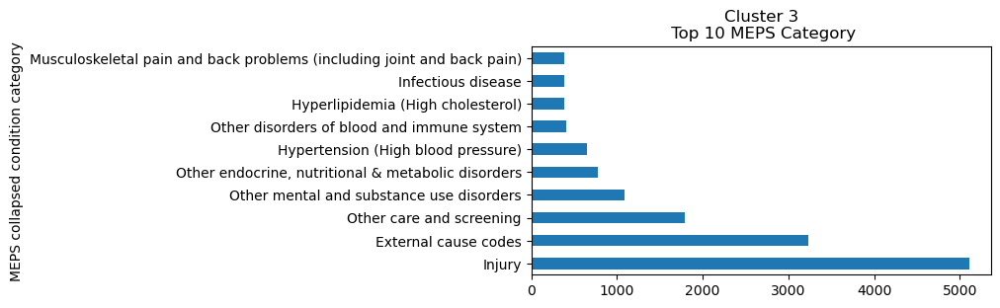

In [178]:
cluster3["MEPS collapsed condition category"].value_counts().head(10).plot.barh(title="Cluster 3\n Top 10 MEPS Category", figsize=(6,3))

#### Cluster 4

In [179]:
cluster4 = pat_diag_ccsr_clus_sc[pat_diag_ccsr_clus_sc['k_means_5'] == 3]
cluster4.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
176765,17732534,28321954,4,F05,10,NVS011,Delirium due to known physiological condition,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,3
176766,17732534,22394844,14,Z8489,10,FAC021,Family history of other specified conditions,Personal/family history of disease,Other care and screening,FAC: Factors influencing health status and con...,3
176767,17732534,22394844,13,R260,10,SYM010,Ataxic gait,Nervous system signs and symptoms,Nervous system signs and symptoms,"SYM: Symptoms, signs and abnormal clinical and...",3
176768,17732534,22394844,12,K219,10,DIG004,Gastro-esophageal reflux disease without esoph...,Esophageal disorders,Disorders of mouth and esophagus (including ac...,DIG: Diseases of the digestive system,3
176769,17732534,28321954,7,K219,10,DIG004,Gastro-esophageal reflux disease without esoph...,Esophageal disorders,Disorders of mouth and esophagus (including ac...,DIG: Diseases of the digestive system,3


<Axes: title={'center': 'Cluster 4\n Top 10 Diagnoses'}, ylabel='diagnose'>

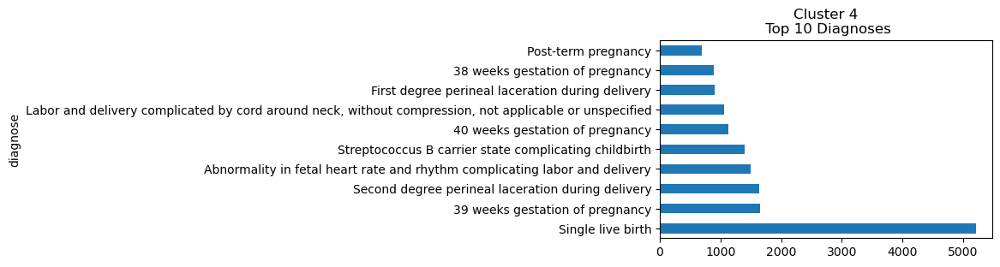

In [180]:
cluster4.diagnose.value_counts().head(10).plot.barh(title="Cluster 4\n Top 10 Diagnoses",figsize=(5,3))

<Axes: title={'center': 'Cluster 4\n Top 10 CCSR Codes'}, ylabel='ccsr_code'>

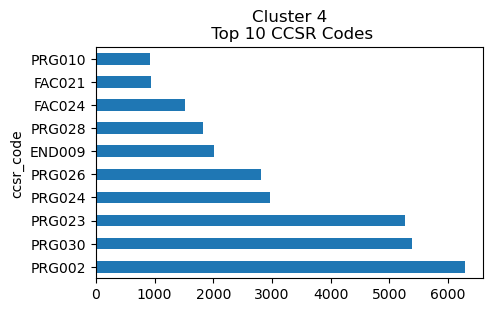

In [181]:
cluster4.ccsr_code.value_counts().head(10).plot.barh(title="Cluster 4\n Top 10 CCSR Codes",figsize=(5,3))

<Axes: title={'center': 'Cluster 4\n Top 10 Category Body System'}, ylabel='Category Body System'>

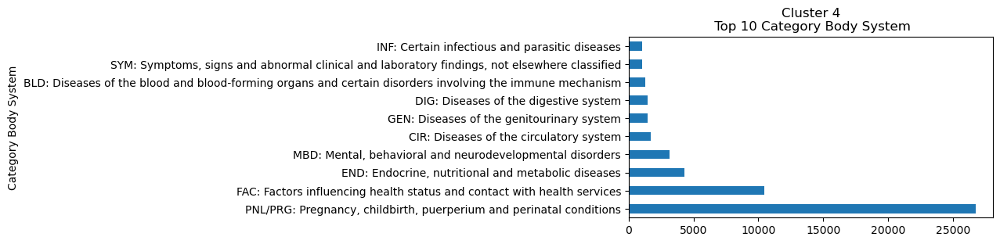

In [202]:
cluster4["Category Body System"].value_counts().head(10).plot.barh(title="Cluster 4\n Top 10 Category Body System",figsize=(6,3))

<Axes: title={'center': 'Cluster 4\n Top 10 MEPS Category'}, ylabel='MEPS collapsed condition category'>

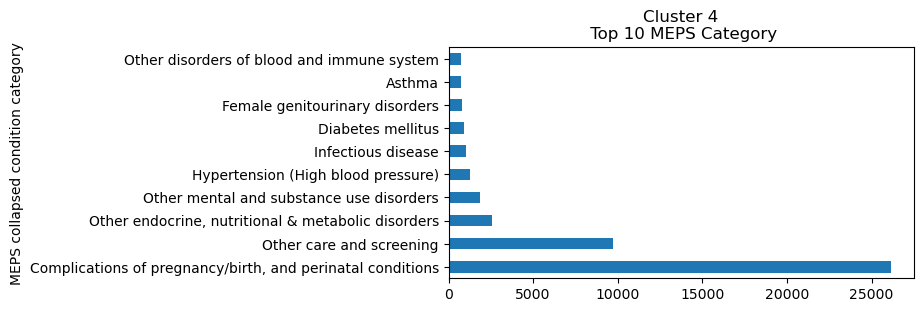

In [183]:
cluster4["MEPS collapsed condition category"].value_counts().head(10).plot.barh(title="Cluster 4\n Top 10 MEPS Category",figsize=(6,3))

#### Cluster 5

In [184]:
cluster5 = pat_diag_ccsr_clus_sc[pat_diag_ccsr_clus_sc['k_means_5'] == 4]
cluster5.head()

,subject_id,hadm_id,seq_num,icd_code,icd_version,ccsr_code,diagnose,CCSR Description,MEPS collapsed condition category,Category Body System,k_means_5
48,10279514,29624303,13,G3183,10,NVS011,Dementia with Lewy bodies,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,4
49,10279514,29624303,14,F0280,10,NVS011,Dementia in other diseases classified elsewher...,Neurocognitive disorders,Neurocognitive disorders (including dementia a...,NVS: Diseases of the nervous system,4
50,10279514,22201318,7,R627,10,SYM016,Adult failure to thrive,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",4
51,10279514,29624303,3,R627,10,SYM016,Adult failure to thrive,Other general signs and symptoms,Symptoms,"SYM: Symptoms, signs and abnormal clinical and...",4
52,10279514,23578816,6,E785,10,END010,"Hyperlipidemia, unspecified",Disorders of lipid metabolism,Hyperlipidemia (High cholesterol),"END: Endocrine, nutritional and metabolic dise...",4


<Axes: title={'center': 'Cluster 5\n Top 10 Diagnoses'}, ylabel='diagnose'>

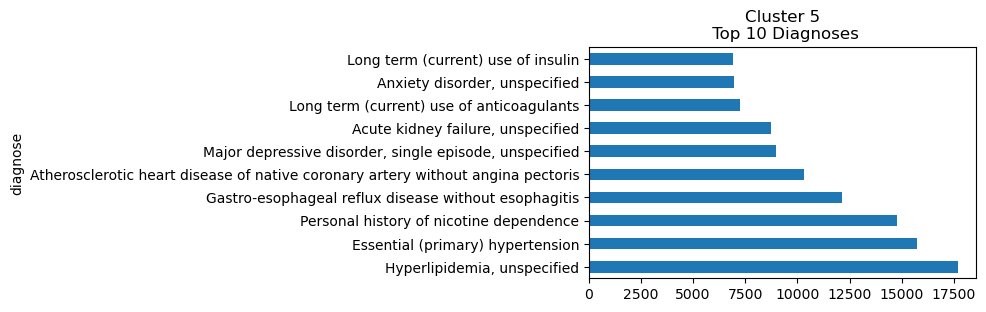

In [185]:
cluster5.diagnose.value_counts().head(10).plot.barh(title="Cluster 5\n Top 10 Diagnoses",figsize=(5,3))

<Axes: title={'center': 'Cluster 5\n Top 10 CCSR Codes'}, ylabel='ccsr_code'>

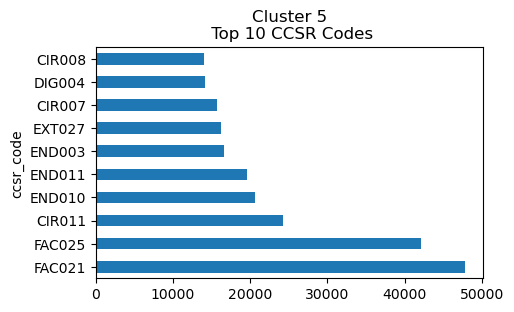

In [186]:
cluster5.ccsr_code.value_counts().head(10).plot.barh(title="Cluster 5\n Top 10 CCSR Codes",figsize=(5,3))

<Axes: title={'center': 'Cluster 5\n Top 10 Category Body System'}, ylabel='Category Body System'>

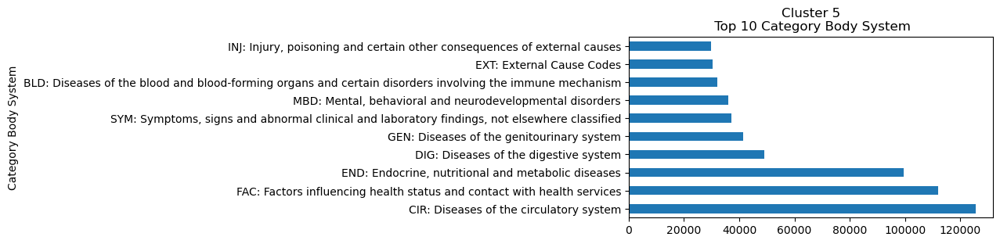

In [187]:
cluster5["Category Body System"].value_counts().head(10).plot.barh(title="Cluster 5\n Top 10 Category Body System", figsize=(6,3))

<Axes: title={'center': 'Cluster 5\n Top 10 MEPS Category'}, ylabel='MEPS collapsed condition category'>

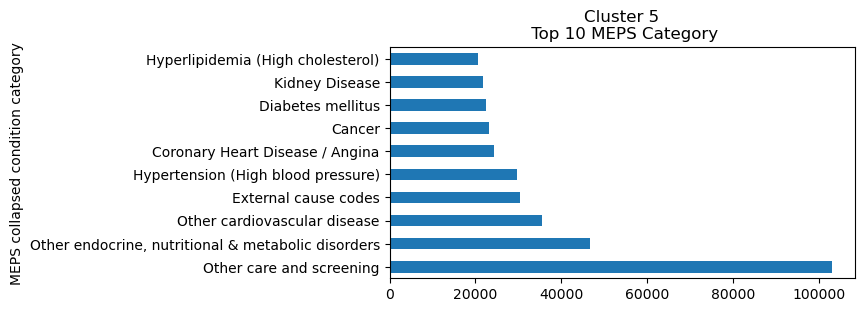

In [188]:
cluster5["MEPS collapsed condition category"].value_counts().head(10).plot.barh(title="Cluster 5\n Top 10 MEPS Category",figsize=(6,3))